<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Marine-life-forecast---Analysis-and-cleaning" data-toc-modified-id="Marine-life-forecast---Analysis-and-cleaning-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Marine life forecast - Analysis and cleaning</a></span><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Introduction</a></span></li></ul></li><li><span><a href="#General-analysis" data-toc-modified-id="General-analysis-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>General analysis</a></span><ul class="toc-item"><li><span><a href="#Importing-libraries" data-toc-modified-id="Importing-libraries-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Importing libraries</a></span></li><li><span><a href="#Downloading-and-importing-data" data-toc-modified-id="Downloading-and-importing-data-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Downloading and importing data</a></span></li><li><span><a href="#General-information" data-toc-modified-id="General-information-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>General information</a></span></li><li><span><a href="#Numerical-information" data-toc-modified-id="Numerical-information-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Numerical information</a></span></li><li><span><a href="#Categorical-information" data-toc-modified-id="Categorical-information-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Categorical information</a></span></li></ul></li><li><span><a href="#Data-quality" data-toc-modified-id="Data-quality-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data quality</a></span><ul class="toc-item"><li><span><a href="#Empty-columns" data-toc-modified-id="Empty-columns-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Empty columns</a></span></li><li><span><a href="#Columns-with-few-values" data-toc-modified-id="Columns-with-few-values-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Columns with few values</a></span></li><li><span><a href="#Columns-with-redundant-information" data-toc-modified-id="Columns-with-redundant-information-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Columns with redundant information</a></span></li><li><span><a href="#Columns-with-possible-inaccurate-information" data-toc-modified-id="Columns-with-possible-inaccurate-information-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Columns with possible inaccurate information</a></span><ul class="toc-item"><li><span><a href="#Elevation" data-toc-modified-id="Elevation-3.4.1"><span class="toc-item-num">3.4.1&nbsp;&nbsp;</span>Elevation</a></span></li><li><span><a href="#Locality" data-toc-modified-id="Locality-3.4.2"><span class="toc-item-num">3.4.2&nbsp;&nbsp;</span>Locality</a></span></li><li><span><a href="#Water-Body" data-toc-modified-id="Water-Body-3.4.3"><span class="toc-item-num">3.4.3&nbsp;&nbsp;</span>Water Body</a></span></li><li><span><a href="#Country-code" data-toc-modified-id="Country-code-3.4.4"><span class="toc-item-num">3.4.4&nbsp;&nbsp;</span>Country code</a></span></li><li><span><a href="#Coordinates" data-toc-modified-id="Coordinates-3.4.5"><span class="toc-item-num">3.4.5&nbsp;&nbsp;</span>Coordinates</a></span></li><li><span><a href="#Depth" data-toc-modified-id="Depth-3.4.6"><span class="toc-item-num">3.4.6&nbsp;&nbsp;</span>Depth</a></span></li><li><span><a href="#Day" data-toc-modified-id="Day-3.4.7"><span class="toc-item-num">3.4.7&nbsp;&nbsp;</span>Day</a></span></li><li><span><a href="#Month" data-toc-modified-id="Month-3.4.8"><span class="toc-item-num">3.4.8&nbsp;&nbsp;</span>Month</a></span></li></ul></li></ul></li><li><span><a href="#Assigning-an-ID-to-every-inmersion" data-toc-modified-id="Assigning-an-ID-to-every-inmersion-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Assigning an ID to every inmersion</a></span></li><li><span><a href="#Selecting-final-columns-and-exporting-dataframe" data-toc-modified-id="Selecting-final-columns-and-exporting-dataframe-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Selecting final columns and exporting dataframe</a></span></li></ul></div>

# Marine life forecast - Analysis and cleaning

## Introduction
The purpouse of this notebook is to analyze the quality of data, to impute NaN values and to select the right columns for the model.

# General analysis

## Importing libraries

In [6]:
import urllib.request
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import cartopy.io.shapereader as shpreader
import shapely.geometry as sgeom
from shapely.ops import unary_union
from shapely.prepared import prep
import gdown
import matplotlib.style as style
style.use('ggplot')
%matplotlib inline
pd.options.display.max_columns = None
%config Completer.use_jedi = False # Autocomplete works faster

## Downloading and importing data
File is stored in my GDrive, so I'll use gdown to download it

In [7]:
data_folder = './data/'
file_id = '1XQR7evd_trK6u2n_e6KSpQ9aJLDiQhH-'
url='https://drive.google.com/uc?id=' + file_id
output_file = 'occurrence.zip'
output = data_folder + output_file
gdown.download(url, output)
df = pd.read_csv(output, sep='\t')

Downloading...
From: https://drive.google.com/uc?id=1XQR7evd_trK6u2n_e6KSpQ9aJLDiQhH-
To: /home/davidgp/workspace/marine_life_forecast/data/occurrence.zip
4.61MB [00:00, 12.8MB/s]
/home/davidgp/anaconda3/envs/malif2/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3155: DtypeWarning: Columns (198,237) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


## General information
Checking columns, NaN values, types of variables and their structure

In [8]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38324 entries, 0 to 38323
Data columns (total 249 columns):
 #    Column                               Non-Null Count  Dtype  
---   ------                               --------------  -----  
 0    gbifID                               38324 non-null  int64  
 1    abstract                             0 non-null      float64
 2    accessRights                         0 non-null      float64
 3    accrualMethod                        0 non-null      float64
 4    accrualPeriodicity                   0 non-null      float64
 5    accrualPolicy                        0 non-null      float64
 6    alternative                          0 non-null      float64
 7    audience                             0 non-null      float64
 8    available                            0 non-null      float64
 9    bibliographicCitation                0 non-null      float64
 10   conformsTo                           0 non-null      float64
 11   contributor  

In [9]:
df.shape

(38324, 249)

In [10]:
df.head(3)

,gbifID,abstract,accessRights,accrualMethod,accrualPeriodicity,accrualPolicy,alternative,audience,available,bibliographicCitation,conformsTo,contributor,coverage,created,creator,date,dateAccepted,dateCopyrighted,dateSubmitted,description,educationLevel,extent,format,hasFormat,hasPart,hasVersion,identifier,instructionalMethod,isFormatOf,isPartOf,isReferencedBy,isReplacedBy,isRequiredBy,isVersionOf,issued,language,license,mediator,medium,modified,provenance,publisher,references,relation,replaces,requires,rights,rightsHolder,source,spatial,subject,tableOfContents,temporal,title,type,valid,institutionID,collectionID,datasetID,institutionCode,collectionCode,datasetName,ownerInstitutionCode,basisOfRecord,informationWithheld,dataGeneralizations,dynamicProperties,occurrenceID,catalogNumber,recordNumber,recordedBy,individualCount,organismQuantity,organismQuantityType,sex,lifeStage,reproductiveCondition,behavior,establishmentMeans,occurrenceStatus,preparations,disposition,associatedReferences,associatedSequences,associatedTaxa,otherCatalogNumbers,occurrenceRemarks,organismID,organismName,organismScope,associatedOccurrences,associatedOrganisms,previousIdentifications,organismRemarks,materialSampleID,eventID,parentEventID,fieldNumber,eventDate,eventTime,startDayOfYear,endDayOfYear,year,month,day,verbatimEventDate,habitat,samplingProtocol,samplingEffort,sampleSizeValue,sampleSizeUnit,fieldNotes,eventRemarks,locationID,higherGeographyID,higherGeography,continent,waterBody,islandGroup,island,countryCode,stateProvince,county,municipality,locality,verbatimLocality,verbatimElevation,verbatimDepth,minimumDistanceAboveSurfaceInMeters,maximumDistanceAboveSurfaceInMeters,locationAccordingTo,locationRemarks,decimalLatitude,decimalLongitude,coordinateUncertaintyInMeters,coordinatePrecision,pointRadiusSpatialFit,verbatimCoordinateSystem,verbatimSRS,footprintWKT,footprintSRS,footprintSpatialFit,georeferencedBy,georeferencedDate,georeferenceProtocol,georeferenceSources,georeferenceVerificationStatus,georeferenceRemarks,geologicalContextID,earliestEonOrLowestEonothem,latestEonOrHighestEonothem,earliestEraOrLowestErathem,latestEraOrHighestErathem,earliestPeriodOrLowestSystem,latestPeriodOrHighestSystem,earliestEpochOrLowestSeries,latestEpochOrHighestSeries,earliestAgeOrLowestStage,latestAgeOrHighestStage,lowestBiostratigraphicZone,highestBiostratigraphicZone,lithostratigraphicTerms,group,formation,member,bed,identificationID,identificationQualifier,typeStatus,identifiedBy,dateIdentified,identificationReferences,identificationVerificationStatus,identificationRemarks,taxonID,scientificNameID,acceptedNameUsageID,parentNameUsageID,originalNameUsageID,nameAccordingToID,namePublishedInID,taxonConceptID,scientificName,acceptedNameUsage,parentNameUsage,originalNameUsage,nameAccordingTo,namePublishedIn,namePublishedInYear,higherClassification,kingdom,phylum,class,order,family,genus,subgenus,specificEpithet,infraspecificEpithet,taxonRank,verbatimTaxonRank,vernacularName,nomenclaturalCode,taxonomicStatus,nomenclaturalStatus,taxonRemarks,datasetKey,publishingCountry,lastInterpreted,elevation,elevationAccuracy,depth,depthAccuracy,distanceAboveSurface,distanceAboveSurfaceAccuracy,issue,mediaType,hasCoordinate,hasGeospatialIssues,taxonKey,acceptedTaxonKey,kingdomKey,phylumKey,classKey,orderKey,familyKey,genusKey,subgenusKey,speciesKey,species,genericName,acceptedScientificName,verbatimScientificName,typifiedName,protocol,lastParsed,lastCrawled,repatriated,relativeOrganismQuantity,recordedByID,identifiedByID,level0Gid,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name
0,2993408646,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,diveboard:462150_216586_0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC_BY_NC_4_0,NaN,NaN,2020-12-10T12:05:05Z,NaN,NaN,https://www.diveboard.com/dejan/D46FCLr,NaN,NaN,NaN,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,NaN,NaN,NaN,NaN,NaN,NaN,Event,NaN,NaN,NaN,https://

In [11]:
df.tail(3)

,gbifID,abstract,accessRights,accrualMethod,accrualPeriodicity,accrualPolicy,alternative,audience,available,bibliographicCitation,conformsTo,contributor,coverage,created,creator,date,dateAccepted,dateCopyrighted,dateSubmitted,description,educationLevel,extent,format,hasFormat,hasPart,hasVersion,identifier,instructionalMethod,isFormatOf,isPartOf,isReferencedBy,isReplacedBy,isRequiredBy,isVersionOf,issued,language,license,mediator,medium,modified,provenance,publisher,references,relation,replaces,requires,rights,rightsHolder,source,spatial,subject,tableOfContents,temporal,title,type,valid,institutionID,collectionID,datasetID,institutionCode,collectionCode,datasetName,ownerInstitutionCode,basisOfRecord,informationWithheld,dataGeneralizations,dynamicProperties,occurrenceID,catalogNumber,recordNumber,recordedBy,individualCount,organismQuantity,organismQuantityType,sex,lifeStage,reproductiveCondition,behavior,establishmentMeans,occurrenceStatus,preparations,disposition,associatedReferences,associatedSequences,associatedTaxa,otherCatalogNumbers,occurrenceRemarks,organismID,organismName,organismScope,associatedOccurrences,associatedOrganisms,previousIdentifications,organismRemarks,materialSampleID,eventID,parentEventID,fieldNumber,eventDate,eventTime,startDayOfYear,endDayOfYear,year,month,day,verbatimEventDate,habitat,samplingProtocol,samplingEffort,sampleSizeValue,sampleSizeUnit,fieldNotes,eventRemarks,locationID,higherGeographyID,higherGeography,continent,waterBody,islandGroup,island,countryCode,stateProvince,county,municipality,locality,verbatimLocality,verbatimElevation,verbatimDepth,minimumDistanceAboveSurfaceInMeters,maximumDistanceAboveSurfaceInMeters,locationAccordingTo,locationRemarks,decimalLatitude,decimalLongitude,coordinateUncertaintyInMeters,coordinatePrecision,pointRadiusSpatialFit,verbatimCoordinateSystem,verbatimSRS,footprintWKT,footprintSRS,footprintSpatialFit,georeferencedBy,georeferencedDate,georeferenceProtocol,georeferenceSources,georeferenceVerificationStatus,georeferenceRemarks,geologicalContextID,earliestEonOrLowestEonothem,latestEonOrHighestEonothem,earliestEraOrLowestErathem,latestEraOrHighestErathem,earliestPeriodOrLowestSystem,latestPeriodOrHighestSystem,earliestEpochOrLowestSeries,latestEpochOrHighestSeries,earliestAgeOrLowestStage,latestAgeOrHighestStage,lowestBiostratigraphicZone,highestBiostratigraphicZone,lithostratigraphicTerms,group,formation,member,bed,identificationID,identificationQualifier,typeStatus,identifiedBy,dateIdentified,identificationReferences,identificationVerificationStatus,identificationRemarks,taxonID,scientificNameID,acceptedNameUsageID,parentNameUsageID,originalNameUsageID,nameAccordingToID,namePublishedInID,taxonConceptID,scientificName,acceptedNameUsage,parentNameUsage,originalNameUsage,nameAccordingTo,namePublishedIn,namePublishedInYear,higherClassification,kingdom,phylum,class,order,family,genus,subgenus,specificEpithet,infraspecificEpithet,taxonRank,verbatimTaxonRank,vernacularName,nomenclaturalCode,taxonomicStatus,nomenclaturalStatus,taxonRemarks,datasetKey,publishingCountry,lastInterpreted,elevation,elevationAccuracy,depth,depthAccuracy,distanceAboveSurface,distanceAboveSurfaceAccuracy,issue,mediaType,hasCoordinate,hasGeospatialIssues,taxonKey,acceptedTaxonKey,kingdomKey,phylumKey,classKey,orderKey,familyKey,genusKey,subgenusKey,speciesKey,species,genericName,acceptedScientificName,verbatimScientificName,typifiedName,protocol,lastParsed,lastCrawled,repatriated,relativeOrganismQuantity,recordedByID,identifiedByID,level0Gid,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name
38321,857000003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,diveboard:7_0_131111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC_BY_NC_4_0,NaN,NaN,2015-04-29T15:41:10Z,NaN,NaN,https://www.diveboard.com/bruno.lestrade/DPaanH,NaN,NaN,NaN,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,NaN,NaN,NaN,NaN,NaN,NaN,Event,NaN,NaN,NaN,ht

## Numerical information

Setting max rows to max to check all columns

In [12]:
pd.set_option('display.max_rows', None)
df.select_dtypes(include='number').describe().transpose()

,count,mean,std,min,25%,50%,75%,max
gbifID,38324.0,1.131412e+09,4.164159e+08,8.570000e+08,8.570101e+08,9.309466e+08,1.261941e+09,2.993409e+09
abstract,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accessRights,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accrualMethod,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accrualPeriodicity,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accrualPolicy,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
alternative,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
audience,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
available,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bibliographicCitation,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Resetting max rows to default value

In [13]:
pd.set_option('display.max_rows', 60)

## Categorical information
For every column I check distinct values, number of NaNs and their percentage

In [14]:
ds_cat = df.select_dtypes(include = 'object')

ds_cat_stats = pd.DataFrame(columns = ['column', 'values', 'values_count_incna', 'values_count_nona', 
                                       'num_miss', 'pct_miss'])
tmp = pd.DataFrame()

for c in ds_cat.columns:
    tmp['column'] = [c]
    tmp['values'] = [ds_cat[c].unique()]
    tmp['values_count_incna'] = len(list(ds_cat[c].unique()))
    tmp['values_count_nona'] = int(ds_cat[c].nunique())
    tmp['num_miss'] = ds_cat[c].isnull().sum()
    tmp['pct_miss'] = (ds_cat[c].isnull().sum()/ len(ds_cat)).round(3)*100
    ds_cat_stats = ds_cat_stats.append(tmp)
    
ds_cat_stats

,column,values,values_count_incna,values_count_nona,num_miss,pct_miss
0,identifier,"[diveboard:462150_216586_0, diveboard:462151_2...",38324,38324,0,0.0
0,license,[CC_BY_NC_4_0],1,1,0,0.0
0,modified,"[2020-12-10T12:05:05Z, 2020-12-07T23:01:31Z, 2...",4526,4526,0,0.0
0,references,"[https://www.diveboard.com/dejan/D46FCLr, http...",10248,10247,4747,12.4
0,rights,[http://creativecommons.org/publicdomain/zero/...,1,1,0,0.0
0,rightsHolder,[Diveboard],1,1,0,0.0
0,type,[Event],1,1,0,0.0
0,datasetID,[https://ipt.diveboard.com/resource.do?r=diveb...,2,2,0,0.0
0,institutionCode,[Diveboard],1,1,0,0.0
0,collectionCode,[Diveboard],1,1,0,0.0


# Data quality
Here I'll check the quality of columns, deleting those that hace their values equal to NaN and creating a list that will contain columns that aren't relevant

## Empty columns
Deleting columns with all values equal to NaN. This step will reduce the number of columns by a significant number

In [15]:
df.dropna(how='all', axis=1, inplace=True)

In [16]:
df.shape

(38324, 82)

## Columns with few values
Cheking which columns have few values. Let's set 10 different values as criterion

In [17]:
columns_few_values = dict()
for column in df.columns:
    num_values = df[column].nunique()
    if df[column].nunique() < 10:
        columns_few_values[column] = num_values
        
columns_few_values

{'license': 1,
 'rights': 1,
 'rightsHolder': 1,
 'type': 1,
 'datasetID': 2,
 'institutionCode': 1,
 'collectionCode': 1,
 'datasetName': 1,
 'ownerInstitutionCode': 1,
 'basisOfRecord': 1,
 'occurrenceStatus': 1,
 'occurrenceRemarks': 1,
 'samplingProtocol': 1,
 'coordinateUncertaintyInMeters': 1,
 'georeferenceSources': 1,
 'nameAccordingTo': 1,
 'kingdom': 4,
 'taxonomicStatus': 3,
 'datasetKey': 1,
 'publishingCountry': 1,
 'elevationAccuracy': 1,
 'hasCoordinate': 1,
 'hasGeospatialIssues': 2,
 'kingdomKey': 4,
 'protocol': 1,
 'lastCrawled': 1,
 'repatriated': 2}

Check their values

In [18]:
for col in columns_few_values.keys():
    print("\033[1m" + col + "\033[0m", 'values:', df[col].unique())

license values: ['CC_BY_NC_4_0']
rights values: ['http://creativecommons.org/publicdomain/zero/1.0/']
rightsHolder values: ['Diveboard']
type values: ['Event']
datasetID values: ['https://ipt.diveboard.com/resource.do?r=diveboard-occurrences'
 'http://ipt.diveboard.com/resource.do?r=diveboard-occurrences']
institutionCode values: ['Diveboard']
collectionCode values: ['Diveboard']
datasetName values: ['Diveboard - Scuba diving citizen science']
ownerInstitutionCode values: ['Diveboard']
basisOfRecord values: ['HUMAN_OBSERVATION']
occurrenceStatus values: ['PRESENT']
occurrenceRemarks values: ['Non validated citizen science record']
samplingProtocol values: ['citizen science scuba dive observation']
coordinateUncertaintyInMeters values: [100.]
georeferenceSources values: ['Google Maps']
nameAccordingTo values: ['EOL']
kingdom values: ['Animalia' 'Chromista' 'incertae sedis' 'Plantae']
taxonomicStatus values: ['ACCEPTED' 'SYNONYM' nan 'DOUBTFUL']
datasetKey values: ['66f6192f-6cc0-45fd-a2

## Columns with redundant information
Check columns that may have redundant information

Check if depth and depthAccuracy have the same values

In [19]:
len(df[df['depth'] == df['depthAccuracy']]), len(df)

(38324, 38324)

Check if dateIdentified has the same date as eventDate

In [20]:
len(df[df['eventDate'].str[0:10] == df['dateIdentified'].str[0:10]]), len(df)

(38324, 38324)

Depth and eventDate will remain in the dataframe

## Columns with possible inaccurate information
There are some columns whose information may be inaccurate.

### Elevation

Let's start with Elevation. Check its info plotting the data in a map. First try drawing coordinates where elevation is lower than 0m.

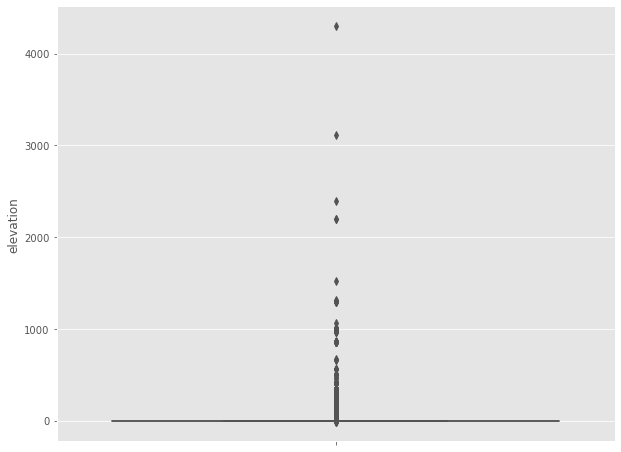

In [38]:
plt.figure(figsize=(10, 8))
sns.boxplot(y=df['elevation'])
plt.show()

Plot them in a map

In [22]:
map_pickup = folium.Map(location = [36.4167754, -3.7037902], zoom_start=1.5)

In [23]:
under_0_cluster = MarkerCluster().add_to(map_pickup)
df[df['elevation'] < 0].apply(lambda row: folium.Marker(location=[row['decimalLatitude'],
                                                                  row['decimalLongitude']],
                                                       popup=row['elevation']).add_to(under_0_cluster), axis=1)
                              
map_pickup

Now plot the coordinates over 0 meters to check if coordinates over sea are correct.

In [24]:
over_0_cluster = MarkerCluster().add_to(map_pickup)
df[df['elevation'] > 0].apply(lambda row: folium.Marker(location=[row['decimalLatitude'],
                                                                  row['decimalLongitude']],
                                                       popup='locality: ' 
                                                        + str(row['locality']) 
                                                        + ', elevation: ' 
                                                        + str(row['elevation'])).add_to(over_0_cluster), axis=1)

map_pickup

Exploring both maps, specially the second one, it is clear that elevation is not accurate enough due there are coordinates over the sea that have elevation greater than 0m.

### Locality
There are some NaN values in locality. For those values i'll fill them with the nearest value sorting by coordinates and filling with ffill

In [25]:
df['locality'].isna().sum()

357

In [26]:
df.sort_values(by=['decimalLongitude','decimalLatitude'], inplace=True)
df['locality'] = df['locality'].fillna(method='ffill')

### Water Body
Let's do the same with waterBody

In [27]:
df['waterBody'].isna().sum()

72

In [28]:
df['waterBody'] = df['waterBody'].fillna(method='ffill')

### Country code
Let's do the same with countryCode

In [29]:
df['countryCode'].isna().sum()

116

In [30]:
df['countryCode'] = df['countryCode'].fillna(method='ffill')

### Coordinates

Next step, check if coordinates have wrong values. Let's check if latitude is between -90 and 90 and longitude is between -180 and 180

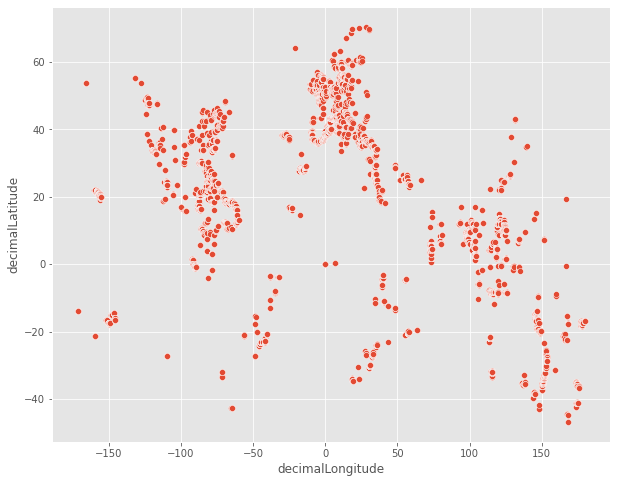

In [31]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='decimalLongitude',y='decimalLatitude')
plt.show()

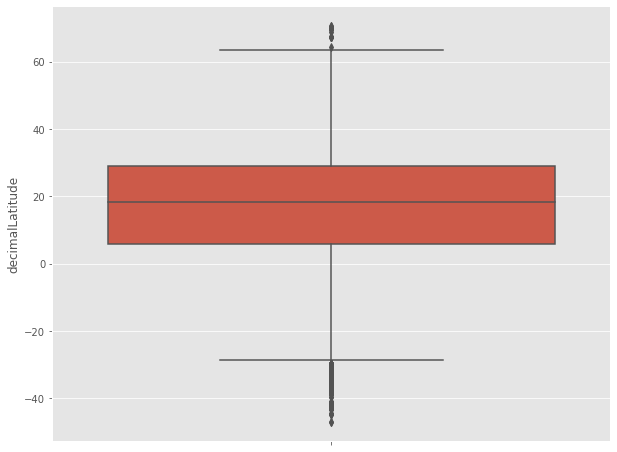

In [32]:
plt.figure(figsize=(10, 8))
sns.boxplot(y=df['decimalLatitude'])
plt.show()

In [83]:
len(df[(df['decimalLatitude'] < -90) | (df['decimalLatitude'] > 90)])

0

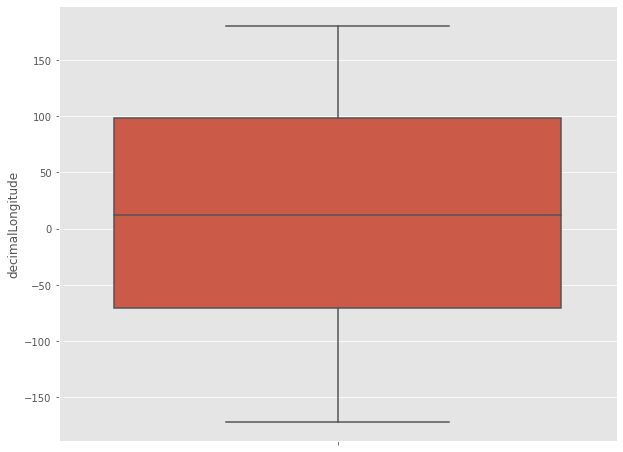

In [33]:
plt.figure(figsize=(10, 8))
sns.boxplot(y=df['decimalLongitude'])
plt.show()

In [85]:
len(df[(df['decimalLongitude'] < -180) | (df['decimalLongitude'] > 180)])

0

It seems that coordinates are OK. Let's check 0,0 coordinates

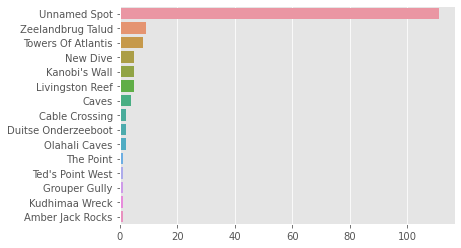

Unnamed Spot           111
Zeelandbrug Talud        9
Towers Of Atlantis       8
New Dive                 5
Kanobi's Wall            5
Livingston Reef          5
Caves                    4
Cable Crossing           2
Duitse Onderzeeboot      2
Olahali Caves            2
The Point                1
Ted's Point West         1
Grouper Gully            1
Kudhimaa Wreck           1
Amber Jack Rocks         1
Name: locality, dtype: int64


In [34]:
locality_zero_coord = df[((df['decimalLatitude'] == 0) & (df['decimalLongitude'] == 0))]['locality'].value_counts()
sns.barplot(x=locality_zero_coord.values, y=locality_zero_coord.index)
plt.show()
print(locality_zero_coord)

Check if it is posible to obtain the coordinates for the same verbatimLocalities in other rows

Create a column with codeCountry + locality

In [87]:
df['country_locality'] = df['countryCode'] + ' - ' + df['locality']
localities_zero_c = df[((df['decimalLatitude'] == 0) & (df['decimalLongitude'] == 0))]['country_locality']\
    .dropna().unique()

Select coordinates different from 0,0 for these places

In [88]:
df_zero_coord = df[(df['country_locality'].isin(localities_zero_c)) &
                   (df['decimalLatitude'] != 0) & (df['decimalLongitude'] != 0)][['country_locality','decimalLatitude', 'decimalLongitude']]

Select just one pair of coordinates per place

In [89]:
df_zero_coord = df_zero_coord.sort_values(by=['country_locality', 'decimalLatitude', 'decimalLongitude']).drop_duplicates(subset='country_locality')

Assign new coordinates

In [90]:
df = df.merge(df_zero_coord, how='left', on='country_locality')

df['decimalLatitude'] = df['decimalLatitude_x']
df['decimalLongitude'] = df['decimalLongitude_x']
df.loc[(df['decimalLatitude_x'] == 0) & (df['decimalLongitude_x'] == 0), 'decimalLatitude'] = df[(df['decimalLatitude_x'] == 0) & (df['decimalLongitude_x'] == 0)]['decimalLatitude_y']
df.loc[(df['decimalLatitude_x'] == 0) & (df['decimalLongitude_x'] == 0), 'decimalLongitude'] = df[(df['decimalLatitude_x'] == 0) & (df['decimalLongitude_x'] == 0)]['decimalLongitude_y']

Delete useless coordinate columns

In [91]:
df.drop(columns=['decimalLatitude_x', 'decimalLongitude_x', 'decimalLatitude_y', 'decimalLongitude_y'], axis=0, inplace=True)

Delete rows with Nan values in coordinates

In [92]:
df = df[~((df['decimalLatitude'].isna()) & (df['decimalLongitude'].isna()))]

Next step, check if coordinates are over land or sea using Cartopy. I'll check if coordinates are inside the land shape downloaded from https://www.naturalearthdata.com/downloads/

In [93]:
land_shp_fname = shpreader.natural_earth(resolution='50m',
                                       category='physical', name='land')
land_geom = unary_union(list(shpreader.Reader(land_shp_fname).geometries()))
land = prep(land_geom)

In [94]:
def is_water(x, y):
    return not land.contains(sgeom.Point(x, y))

In [95]:
df['is_water'] = df.apply(lambda row: is_water(row['decimalLatitude'], row['decimalLongitude']), axis=1)

In [96]:
is_water = MarkerCluster().add_to(map_pickup)
df[df['is_water'] == False].apply(lambda row: folium.Marker(location=[row['decimalLatitude'],
                                                                  row['decimalLongitude']],
                                                       popup='locatiliy: ' 
                                                        + str(row['locality']) 
                                                        + ', elevation: ' 
                                                        + str(row['elevation'])
                                                        + ', Latitude: '
                                                        + str(row['decimalLatitude'])
                                                        + ', Longitude: '
                                                        + str(row['decimalLongitude'])).add_to(is_water), axis=1)

map_pickup

Using natural_earth with shapely is not accurate enough to check if coordinates are over sea or land because there are coordinates over sea that appear as 'no water'.
Besides, there are coordinates that probably correspond to the diving center instead of the diving spot.

### Depth
Let's check maximun and minimun depth

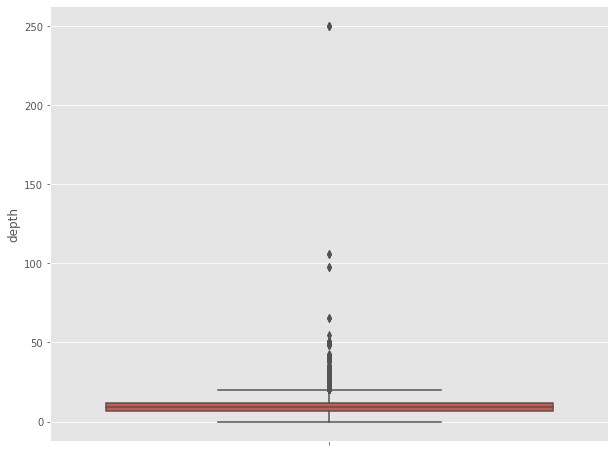

In [35]:
plt.figure(figsize=(10, 8))
sns.boxplot(y=df['depth'])
plt.show()

In [98]:
df['depth'].max(), df['depth'].min()

(250.0, 0.0)

Check depths greater than 40m because 40 is the maximum depth allow for non technical divers

In [99]:
len(df[df['depth'] > 40]['depth'])

39

It seems that there are some rows that have depth greater than 40m. For these inmersions I'll assign 40 meters

In [100]:
df.loc[df['depth'] > 40, 'depth'] = 40
len(df[df['depth'] > 40]['depth'])

0

### Day
Checking day column

1 - 31


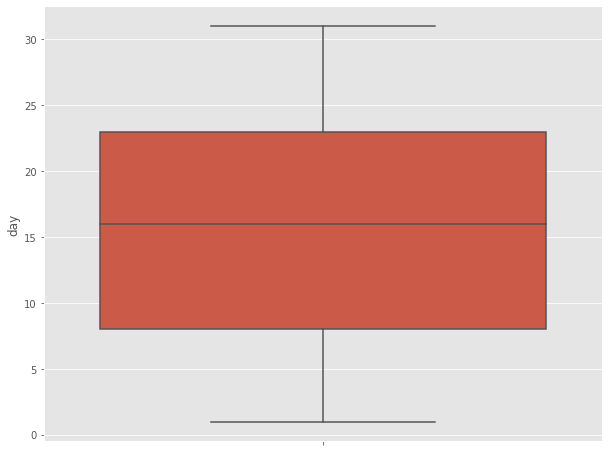

In [36]:
print(df['day'].min(), '-', df['day'].max())
plt.figure(figsize=(10, 8))
sns.boxplot(y=df['day'])
plt.show()

### Month
Checking month column

1 - 12


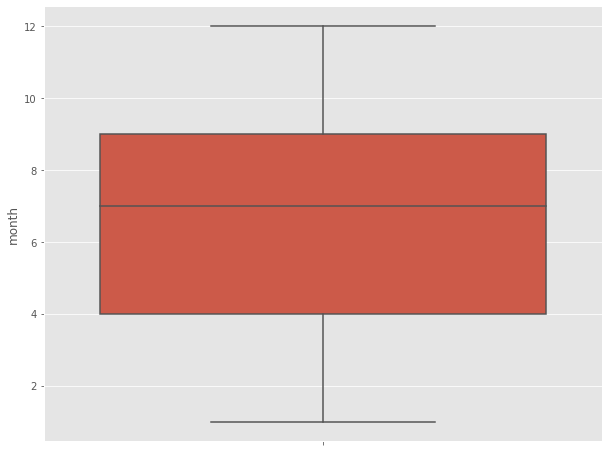

In [37]:
print(df['month'].min(), '-', df['month'].max())
plt.figure(figsize=(10, 8))
sns.boxplot(y=df['month'])
plt.show()

# Assigning an ID to every inmersion
The objective of the model is classify the animals seen per inmersion, but the dataset contains a row per animal sighting, so let's assign an id to every inmersion

It seems that references column identifies a unique dive. Using the value of the column
in a web explorer shows you the dive data in diveboard.com

In [108]:
print(df['references'].nunique(), len(df))
df[df['references'] == 'https://www.diveboard.com/zylantha/D3D8Nbu']\
  [['eventDate', 'decimalLatitude', 'decimalLongitude', 'depth', 'locality', 'waterBody', 'countryCode']]

10202 38177


,eventDate,decimalLatitude,decimalLongitude,depth,locality,waterBody,countryCode
27,2013-06-04T17:11:00,-21.2292,-159.776,9.905,Papua Reef,South Pacific Ocean,CK
28,2013-06-04T17:11:00,-21.2292,-159.776,9.905,Papua Reef,South Pacific Ocean,CK
29,2013-06-04T17:11:00,-21.2292,-159.776,9.905,Papua Reef,South Pacific Ocean,CK
30,2013-06-04T17:11:00,-21.2292,-159.776,9.905,Papua Reef,South Pacific Ocean,CK
31,2013-06-04T17:11:00,-21.2292,-159.776,9.905,Papua Reef,South Pacific Ocean,CK


Check how many NaNs there are

In [109]:
df['references'].isna().sum()

4742

Assign a new id based on references column. Rows with Nan in references column will have -1 id value

In [110]:
df['dive_id'] = df['references'].astype('category').cat.codes
df[~df['references'].isna()].sort_values(by='dive_id').head()

,gbifID,identifier,license,modified,references,rights,rightsHolder,type,datasetID,institutionCode,collectionCode,datasetName,ownerInstitutionCode,basisOfRecord,occurrenceID,catalogNumber,recordedBy,occurrenceStatus,occurrenceRemarks,eventDate,year,month,day,samplingProtocol,waterBody,countryCode,locality,verbatimLocality,coordinateUncertaintyInMeters,georeferenceSources,identifiedBy,dateIdentified,taxonID,scientificName,nameAccordingTo,kingdom,phylum,class,order,family,genus,specificEpithet,infraspecificEpithet,taxonRank,taxonomicStatus,datasetKey,publishingCountry,lastInterpreted,elevation,elevationAccuracy,depth,depthAccuracy,issue,hasCoordinate,hasGeospatialIssues,taxonKey,acceptedTaxonKey,kingdomKey,phylumKey,classKey,orderKey,familyKey,genusKey,speciesKey,species,genericName,acceptedScientificName,verbatimScientificName,protocol,lastParsed,lastCrawled,repatriated,level0Gid,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name,country_locality,decimalLatitude,decimalLongitude,is_water,dive_id
32945,1697157143,diveboard:379088_212303_0,CC_BY_NC_4_0,2017-10-25T14:12:10Z,http://www.diveboard.com/GAyVC3gMnXTIKnGu4Z1jr...,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,Event,http://ipt.diveboard.com/resource.do?r=diveboa...,Diveboard,Diveboard,Diveboard - Scuba diving citizen science,Diveboard,HUMAN_OBSERVATION,diveboard:379088_212303_0,diveboard:379088_212303_0,Nickname,PRESENT,Non validated citizen science record,2015-04-30T15:32:00,2015,4,30,citizen science scuba dive observation,Indian Ocean,MY,Seaventures House Reef,"Seaventures House Reef, Borneo, Mabul Island",100.0,Google Maps,Nickname,2015-04-30T00:00:00,http://eol.org/pages/212303,"Pterois volitans (Linnaeus, 1758)",EOL,Animalia,Chordata,Actinopterygii,Scorpaeniformes,Scorpaenidae,Pterois,volitans,NaN,SPECIES,ACCEPTED,66f6192f-6cc0-45fd-a2d1-e76f5ae3eab2,FR,2020-12-15T21:04:10.600Z,0.0,0.0,8.40,8.40,COORDINATE_REPROJECTION_SUSPICIOUS;INSTITUTION...,True,False,2334438,2334438.0,1,44.0,204.0,590.0,4508.0,2334432.0,2334438.0,Pterois volitans,Pterois,"Pterois volitans (Linnaeus, 1758)","Pterois volitans (Linnaeus, 1758)",DWC_ARCHIVE,2020-12-15T21:04:10.600Z,2020-12-11T15:02:29.629Z,True,MYS,Malaysia,MYS.13_1,Sabah,MYS.13.19_1,Semporna,NaN,NaN,MY - Seaventures House Reef,4.25371,118.6330,True,0
32946,1697157139,diveboard:379089_212303_0,CC_BY_NC_4_0,2017-10-27T11:03:48Z,http://www.diveboard.com/GAyVC3gMnXTIKnGu4Z1jr...,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,Event,http://ipt.diveboard.com/resource.do?r=diveboa...,Diveboard,Diveboard,Diveboard - Scuba diving citizen science,Diveboard,HUMAN_OBSERVATION,diveboard:379089_212303_0,diveboard:379089_212303_0,Nickname,PRESENT,Non validated citizen science record,2015-04-30T15:32:00,2015,4,30,citizen science scuba dive observation,Indian Ocean,MY,Seaventures House Reef,"Seaventures House Reef, Borneo, Mabul Island",100.0,Google Maps,Nickname,2015-04-30T00:00:00,http://eol.org/pages/212303,"Pterois volitans (Linnaeus, 1758)",EOL,Animalia,Chordata,Actinopterygii,Scorpaeniformes,Scorpaenidae,Pterois,volitans,NaN,SPECIES,ACCEPTED,66f6192f-6cc0-45fd-a2d1-e76f5ae3eab2,FR,2020-12-15T21:04:18.871Z,0.0,0.0,8.40,8.40,COORDINATE_REPROJECTION_SUSPICIOUS;INSTITUTION...,True,False,2334438,2334438.0,1,44.0,204.0,590.0,4508.0,2334432.0,2334438.0,Pterois volitans,Pterois,"Pterois volitans (Linnaeus, 1758)","Pterois volitans (Linnaeus, 1758)",DWC_ARCHIVE,2020-12-15T21:04:18.871Z,2020-12-11T15:02:29.629Z,True,MYS,Malaysia,MYS.13_1,Sabah,MYS.13.19_1,Semporna,NaN,NaN,MY - Seaventures House Reef,4.25371,118.6330,True,1
4239,919317000,diveboard:140772_994432_0,CC_BY_NC_4_0,2014-06-02T09:49:43Z,http://www.diveboard.com/anabel/D45Lb8G,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,Event,http://ipt.diveboard.com/resource.do?r=diveboa...,Diveboard,Diveboard,Diveboard - Scuba diving citizen science,Diveboard,HUMAN_OBSERVATION,diveboard:140772_994432_0,diveboard:140772_994432_0,Anabel,PRESENT,Non

For those dives with no reference I'll group then by day, coordinates and depth 
and treat every combination as if they are an unique dive

In [111]:
df_nan_references = df[df['references'].isna()].groupby(['eventDate', 'decimalLatitude', 'decimalLongitude', 'depth'])['gbifID'].count().reset_index()

dive_id will start in max dive_id from df plus 1

In [112]:
start_dive_id = df['dive_id'].max() + 1
df_nan_references['dive_id'] = [id for id in range(start_dive_id, start_dive_id+len(df_nan_references))]
df_nan_references.drop(columns=['gbifID'], inplace=True)
df_nan_references.head()

,eventDate,decimalLatitude,decimalLongitude,depth,dive_id
0,1980-10-25T13:45:00,42.6851,-70.6418,6.860,10202
1,1980-11-08T11:05:00,42.4294,-70.9305,5.335,10203
2,1981-01-19T11:34:00,17.9676,-62.9616,9.145,10204
3,1981-07-18T14:49:00,42.3058,-70.9703,4.570,10205
4,1983-01-17T15:30:00,17.0095,-61.8906,6.860,10206


Now, assign the new value of dive_id for references nan values

In [113]:
df = df.merge(df_nan_references, how='left', on=['eventDate', 'decimalLatitude', 'decimalLongitude', 'depth'])
df['dive_id'] = df['dive_id_x']
df.loc[df['dive_id_x'] == -1, 'dive_id'] = df['dive_id_y']
df['dive_id'] = df['dive_id'].astype(int)
df.drop(columns=['dive_id_x', 'dive_id_y'], inplace=True)
df.head()

,gbifID,identifier,license,modified,references,rights,rightsHolder,type,datasetID,institutionCode,collectionCode,datasetName,ownerInstitutionCode,basisOfRecord,occurrenceID,catalogNumber,recordedBy,occurrenceStatus,occurrenceRemarks,eventDate,year,month,day,samplingProtocol,waterBody,countryCode,locality,verbatimLocality,coordinateUncertaintyInMeters,georeferenceSources,identifiedBy,dateIdentified,taxonID,scientificName,nameAccordingTo,kingdom,phylum,class,order,family,genus,specificEpithet,infraspecificEpithet,taxonRank,taxonomicStatus,datasetKey,publishingCountry,lastInterpreted,elevation,elevationAccuracy,depth,depthAccuracy,issue,hasCoordinate,hasGeospatialIssues,taxonKey,acceptedTaxonKey,kingdomKey,phylumKey,classKey,orderKey,familyKey,genusKey,speciesKey,species,genericName,acceptedScientificName,verbatimScientificName,protocol,lastParsed,lastCrawled,repatriated,level0Gid,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name,country_locality,decimalLatitude,decimalLongitude,is_water,dive_id
0,2813227452,diveboard:455829_454546_0,CC_BY_NC_4_0,2020-11-02T22:15:07Z,https://www.diveboard.com/docdiver/D1FFiMh,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,Event,https://ipt.diveboard.com/resource.do?r=divebo...,Diveboard,Diveboard,Diveboard - Scuba diving citizen science,Diveboard,HUMAN_OBSERVATION,diveboard:455829_454546_0,diveboard:455829_454546_0,Docdiver,PRESENT,Non validated citizen science record,2019-05-29T10:06:00,2019,5,29,citizen science scuba dive observation,South Pacific Ocean,WS,Taliga,"Taliga, Faga Loa",100.0,Google Maps,Docdiver,2019-05-29T00:00:00,http://eol.org/pages/454546,"Chelonia mydas (Linnaeus, 1758)",EOL,Animalia,Chordata,Reptilia,Testudines,Cheloniidae,Chelonia,mydas,NaN,SPECIES,ACCEPTED,66f6192f-6cc0-45fd-a2d1-e76f5ae3eab2,FR,2020-12-15T21:04:18.469Z,0.0,0.0,13.50,13.50,COORDINATE_REPROJECTION_SUSPICIOUS;INSTITUTION...,True,False,2442225,2442225.0,1,44.0,358.0,793.0,9413.0,2441864.0,2442225.0,Chelonia mydas,Chelonia,"Chelonia mydas (Linnaeus, 1758)",Chelonia mydas Linnaeus 1758,DWC_ARCHIVE,2020-12-15T21:04:18.469Z,2020-12-11T15:02:29.629Z,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WS - Taliga,-13.9387,-171.553,True,2492
1,2813227433,diveboard:455830_455968_0,CC_BY_NC_4_0,2020-11-02T22:15:07Z,https://www.diveboard.com/docdiver/D1IuN3A,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,Event,https://ipt.diveboard.com/resource.do?r=divebo...,Diveboard,Diveboard,Diveboard - Scuba diving citizen science,Diveboard,HUMAN_OBSERVATION,diveboard:455830_455968_0,diveboard:455830_455968_0,Docdiver,PRESENT,Non validated citizen science record,2019-05-29T12:15:00,2019,5,29,citizen science scuba dive observation,South Pacific Ocean,WS,Cowabunga,"Cowabunga, Faga Loa",100.0,Google Maps,Docdiver,2019-05-29T00:00:00,http://eol.org/pages/455968,"Eretmochelys imbricata (Linnaeus, 1766)",EOL,Animalia,Chordata,Reptilia,Testudines,Cheloniidae,Eretmochelys,imbricata,NaN,SPECIES,ACCEPTED,66f6192f-6cc0-45fd-a2d1-e76f5ae3eab2,FR,2020-12-15T21:04:17.166Z,0.0,0.0,10.20,10.20,COORDINATE_REPROJECTION_SUSPICIOUS;INSTITUTION...,True,False,8841716,8841716.0,1,44.0,358.0,793.0,9413.0,2442206.0,8841716.0,Eretmochelys imbricata,Eretmochelys,"Eretmochelys imbricata (Linnaeus, 1766)",Eretmochelys imbricata (LINNAEUS) 1766,DWC_ARCHIVE,2020-12-15T21:04:17.166Z,2020-12-11T15:02:29.629Z,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WS - Cowabunga,-13.9387,-171.553,True,2493
2,2813227425,diveboard:455830_454546_0,CC_BY_NC_4_0,2020-11-02T22:15:07Z,https://www.diveboard.com/docdiver/D1IuN3A,http://creativecommons.org/publicdomain/zero/1.0/,Diveboard,Event,https://ipt.diveboard.com/resource.do?r=divebo...,Diveboard,Diveboard,Diveboard - Scuba diving citizen science,Diveboard,HUMAN_OBSERVATION,diveboard:455830_454546_0,diveboard:455830_454546_0,Docdiver,PRESENT,Non validated citizen science record,2019-05-29T12:15:00,2019,5,29,citizen science scuba dive observation,South Pacific Ocean,WS,Cowabunga,"Cowabunga, Faga Loa",10

# Selecting final columns and exporting dataframe
After the analysis, empty columns, columns with redundant information, with innacurate information and those columns with information about animals will be discarded, but columns with ids (keys) will remain because they will be used to download common names from https://www.gbif.org

Because the goal of the proyect is predicting animal marine life, I'll select only Animalia kingdom rows.  
Rows with all null taxa  values will be deleted

In [114]:
df['kingdom'].value_counts()

Animalia          38089
incertae sedis       44
Plantae              29
Chromista            15
Name: kingdom, dtype: int64

In [115]:
df = df[df['kingdom'] == 'Animalia']

df.dropna(subset=['orderKey', 'familyKey', 'genusKey', 'speciesKey'], how='all', inplace=True)

Final columns

In [116]:
final_columns = ['eventDate', 'month', 'day', 'waterBody', 'countryCode', 'locality', 
                 'dive_id', 'decimalLatitude', 'decimalLongitude', 'depth', 'orderKey', 
                 'familyKey', 'genusKey', 'speciesKey']
df = df[final_columns]
df.head(3)

,eventDate,month,day,waterBody,countryCode,locality,dive_id,decimalLatitude,decimalLongitude,depth,orderKey,familyKey,genusKey,speciesKey
0,2019-05-29T10:06:00,5,29,South Pacific Ocean,WS,Taliga,2492,-13.9387,-171.553,13.5,793.0,9413.0,2441864.0,2442225.0
1,2019-05-29T12:15:00,5,29,South Pacific Ocean,WS,Cowabunga,2493,-13.9387,-171.553,10.2,793.0,9413.0,2442206.0,8841716.0
2,2019-05-29T12:15:00,5,29,South Pacific Ocean,WS,Cowabunga,2493,-13.9387,-171.553,10.2,793.0,9413.0,2441864.0,2442225.0


In [117]:
output_file = 'occurrence_cleaned.txt'
df.to_csv(data_folder + output_file, index=False)